# Data processing

## Read data & some functionls

In [73]:
import pandas as pd

In [74]:
df = pd.read_csv("HW2_data.csv")
# urine = pd.read_csv("urine_data.csv")
race = pd.read_csv("race.csv")
glucose = pd.read_csv("glucose.csv")

In [75]:
df.describe()

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,combined_min_glucose,combined_avg_glucose,combined_max_glucose,vasopressin
count,1.736000e+03,1.736000e+03,1.736000e+03,1736.000000,1736.000000,1137.000000,1236.000000,1236.000000,1245.000000,1245.000000,1245.000000,1245.000000,1245.000000,1245.000000,1245.000000,1170.000000
mean,1.497891e+07,2.504886e+07,3.499544e+07,0.167627,63.555876,1801.346526,3.010175,97.796521,228.065060,3.828896,64.968114,420.393253,3.828896,64.968114,420.393253,13.643504
std,2.943247e+06,2.847673e+06,2.915910e+06,0.373642,16.679356,1771.444148,13.462807,6.311014,50.309687,16.528915,11.381507,238.424048,16.528915,11.381507,238.424048,39.006714
min,1.001527e+07,2.001150e+07,3.000250e+07,0.000000,21.000000,0.000000,0.010000,25.000000,46.300000,0.010000,24.866667,46.300000,0.010000,24.866667,46.300000,0.000000
25%,1.244207e+07,2.263785e+07,3.249838e+07,0.000000,54.000000,800.000000,0.020000,99.000000,185.000000,0.020000,59.008272,226.000000,0.020000,59.008272,226.000000,0.201173
50%,1.483727e+07,2.505770e+07,3.505184e+07,0.000000,65.000000,1350.000000,0.190000,99.000000,234.000000,0.200000,63.396842,343.000000,0.200000,63.396842,343.000000,1.000000
75%,1.768229e+07,2.747245e+07,3.748562e+07,0.000000,76.000000,2275.000000,0.700000,99.200000,273.000000,0.700000,68.064259,591.000000,0.700000,68.064259,591.000000,2.000000
max,1.999678e+07,2.999533e+07,3.999687e+07,1.000000,99.000000,26615.000000,93.600000,99.900000,299.200000,140.500000,140.500000,995.000000,140.500000,140.500000,995.000000,543.749979


In [76]:
def clean_race(value):
    if value is None:
        return None
    val = value.strip().upper()
    if val.startswith('WHITE'):
        return 'White'
    elif val.startswith('BLACK'):
        return 'Black'
    elif val.startswith('UNKNOWN'):
        return 'Other'
    elif val.startswith('OTHER'):
        return 'Other'
    elif val.startswith('ASIAN'):
        return 'Asian'
    elif val.startswith('HISPANIC'):
        return 'Hispanic'
    elif val.startswith('PORTUGUESE'):
        return 'Portuguese'
    else:
        return 'Other'
race['race'] = race['race'].apply(clean_race)

In [77]:
race["race"].value_counts()

race
White         1160
Other          255
Black          223
Hispanic        53
Asian           39
Portuguese       6
Name: count, dtype: int64

In [78]:
df.columns
# print(urine.columns)

Index(['subject_id', 'hadm_id', 'stay_id', 'in_hospital_mortality', 'age',
       'gender', 'total_urine_output_ml', 'min_hemoglobin', 'max_hemoglobin',
       'max_heart_rate', 'min_resp_rate', 'avg_resp_rate', 'max_resp_rate',
       'combined_min_glucose', 'combined_avg_glucose', 'combined_max_glucose',
       'vasopressin'],
      dtype='object')

In [79]:
join_keys = ['subject_id','hadm_id','stay_id']
race = race[join_keys+['race']]
# df = pd.merge(df,urine, on=join_keys, how='left')
df = pd.merge(df,race, on=join_keys,how='left')
df = pd.merge(df,glucose, on=join_keys,how='left')

In [80]:
df.drop("combined_min_glucose",axis=1,inplace=True)
df.drop("combined_avg_glucose",axis=1,inplace=True)
df.drop("combined_max_glucose",axis=1,inplace=True)

In [81]:
df["use_vasopressin"] = df["vasopressin"].notnull().astype(int)

In [82]:
df.head(1)

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,gender,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,race,min_glucose,max_glucose,avg_glucose,use_vasopressin
0,10711349,25928774,39575548,0,49,M,2250.0,0.7,99.0,287.0,0.7,62.027502,287.0,88.43537,Black,95.0,95.0,95.0,1


In [83]:
df_0 = df[df["in_hospital_mortality"]==0]
df_1 = df[df["in_hospital_mortality"]==1]
alive = len(df_0)
dead = len(df_1)

In [84]:
df_0

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,gender,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,race,min_glucose,max_glucose,avg_glucose,use_vasopressin
0,10711349,25928774,39575548,0,49,M,2250.0,0.70,99.0,287.0,0.70,62.027502,287.0,88.43537,Black,95.0,95.0,95.0,1
1,17414299,28050324,39821107,0,57,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,White,122.0,124.0,123.0,0
2,18553288,21713414,37661257,0,80,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,White,201.0,206.0,203.5,0
3,19291839,20773333,37533185,0,25,M,2200.0,0.08,99.4,230.0,0.08,59.026823,230.0,1.00000,Other,97.0,104.0,100.5,1
4,13141943,20806200,39725789,0,47,M,1550.0,0.60,99.0,219.9,0.60,60.974194,219.9,2.00000,White,111.0,163.0,137.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1730,16614777,29435002,31237667,0,25,F,3405.0,0.25,99.6,184.0,0.25,41.791975,445.0,0.50000,White,141.0,141.0,141.0,1
1732,14412915,27145067,32411992,0,74,F,945.0,0.33,99.0,265.0,0.33,64.341534,552.0,0.02667,White,141.0,141.0,141.0,1
1733,18535260,27121275,31414946,0,29,F,1250.0,0.41,99.1,296.0,0.41,58.507793,550.0,0.50000,White,91.0,142.0,112.0,1
1734,19544330,25186323,32438211,0,42,M,2770.0,0.40,99.0,287.0,0.40,63.999387,763.0,1.00000,White,100.0,105.0,103.0,1


In [85]:
df_1

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,gender,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,race,min_glucose,max_glucose,avg_glucose,use_vasopressin
6,10097659,22071424,32530604,1,71,M,2080.0,0.10,99.0,289.0,0.10,76.596464,970.0,0.049231,White,281.0,287.0,283.333333,1
10,18023584,22100119,39005422,1,57,F,352.0,1.00,99.0,296.0,1.00,68.875249,385.0,0.500000,White,345.0,381.0,367.000000,1
13,19404265,26466590,36121575,1,78,M,3134.0,0.01,99.9,253.0,0.01,60.594211,750.0,0.000833,Other,102.0,108.0,105.000000,1
20,12964338,26360933,32584570,1,62,M,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,White,99.0,109.0,104.000000,0
31,13114866,29216339,37807361,1,82,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,White,100.0,112.0,106.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1708,13188963,23158537,38544826,1,71,M,5.0,0.06,99.0,298.0,0.06,94.565905,750.0,0.010490,White,138.0,314.0,223.833333,1
1711,13762552,27329464,30272545,1,75,F,3055.0,0.01,99.3,252.0,0.01,64.649818,414.0,1.000000,Other,137.0,142.0,139.500000,1
1720,12125322,20463676,32488116,1,37,F,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,White,113.0,113.0,113.000000,0
1725,18575294,22776230,31301788,1,83,F,785.0,0.05,99.0,275.0,0.05,55.148396,575.0,0.269062,White,113.0,157.0,135.000000,1


## Useless

In [86]:
miss_urine = df["total_urine_output_ml"].isnull().sum()
miss_gender = df["gender"].isnull().sum()
miss_age = df["age"].isnull().sum()
miss_min_hemoglobin = df["min_hemoglobin"].isnull().sum()
miss_max_hemoglobin = df["max_hemoglobin"].isnull().sum()
miss_avg_resp_rate = df["avg_resp_rate"].isnull().sum()
miss_max_heart_rate = df["max_heart_rate"].isnull().sum()
# miss_combined_avg_glucose = df["combined_avg_glucose"].isnull().sum()
# miss_combined_max_glucose = df["combined_max_glucose"].isnull().sum()

In [87]:
Urine_0_mean = df_0["total_urine_output_ml"].mean()
Urine_1_mean = df_1["total_urine_output_ml"].mean()

Vasopressin_0 = df_0["vasopressin"].isnull().sum()
Vasopressin_1 = df_1["vasopressin"].isnull().sum()

In [88]:
print(f"Urine output (mean) \n\
Missing : = ")

Urine output (mean) 
Missing : = 


In [89]:
print(f"Alive & Use = {alive - Vasopressin_0}\n\
Alive & not use = {Vasopressin_0}\n\
Dead & Use = {dead - Vasopressin_1}\n\
Dead & not use = {Vasopressin_1}")

Alive & Use = 994
Alive & not use = 451
Dead & Use = 176
Dead & not use = 115


## Use tableone for table

In [90]:
# !pip install tableone
from tableone import TableOne

In [91]:
def get_categorical_numerical_variables(df, limit, ignore, verbose=True):
    """
    File to get numerical and categorical variables
    Inputs:
    df: A pandas dataframe with all the variables
    limit: A integer with the maximum number of unique items in a variable to be categorical
    ignore: Python list with columns to ignore

    Outputs:
    categorical_columns, numerical_columns: List with the names of categorical and numerical variables

    """

    categorical_columns = []
    numerical_columns = []

    for column in df.columns:
        if ignore:
            if column in ignore:
                continue
        unique_values = len(pd.unique(df[column]))
        if unique_values <= limit:
            if verbose:
                print(f'The column {column} has {unique_values}, so is categorical')
            categorical_columns.append(column)
        else:
            if verbose:
                print(f'The column {column} has {unique_values}, so is numerical')
            numerical_columns.append(column)

    return categorical_columns, numerical_columns

In [92]:
df_1.columns

Index(['subject_id', 'hadm_id', 'stay_id', 'in_hospital_mortality', 'age',
       'gender', 'total_urine_output_ml', 'min_hemoglobin', 'max_hemoglobin',
       'max_heart_rate', 'min_resp_rate', 'avg_resp_rate', 'max_resp_rate',
       'vasopressin', 'race', 'min_glucose', 'max_glucose', 'avg_glucose',
       'use_vasopressin'],
      dtype='object')

In [93]:
vaso_0 = df[df["vasopressin"]>=0]
vaso_0 = vaso_0[["subject_id","hadm_id","stay_id","in_hospital_mortality","vasopressin"]]
vaso_1 = df[df["vasopressin"].isnull()]
vaso_1 = vaso_1[["subject_id","hadm_id","stay_id","in_hospital_mortality","vasopressin"]]
print(vaso_0,vaso_1)
# mytable = TableOne()

      subject_id   hadm_id   stay_id  in_hospital_mortality  vasopressin
0       10711349  25928774  39575548                      0    88.435370
3       19291839  20773333  37533185                      0     1.000000
4       13141943  20806200  39725789                      0     2.000000
6       10097659  22071424  32530604                      1     0.049231
8       14374733  26158490  30259662                      0     2.000000
...          ...       ...       ...                    ...          ...
1730    16614777  29435002  31237667                      0     0.500000
1731    19995127  27369164  32899958                      1     1.000000
1732    14412915  27145067  32411992                      0     0.026670
1733    18535260  27121275  31414946                      0     0.500000
1734    19544330  25186323  32438211                      0     1.000000

[1170 rows x 5 columns]       subject_id   hadm_id   stay_id  in_hospital_mortality  vasopressin
1       17414299  28050324

In [94]:
groupby = 'in_hospital_mortality'
ignore = ['subject_id', 'hadm_id', 'stay_id', 'in_hospital_mortality']
categorical_variables, numerical_variables = get_categorical_numerical_variables(df,10,ignore)
columns = categorical_variables + numerical_variables
mytable = TableOne(df, columns=columns, categorical=categorical_variables, nonnormal=numerical_variables, groupby=groupby, pval=True)
mytable

The column age has 77, so is numerical
The column gender has 2, so is categorical
The column total_urine_output_ml has 622, so is numerical
The column min_hemoglobin has 97, so is numerical
The column max_hemoglobin has 68, so is numerical
The column max_heart_rate has 315, so is numerical
The column min_resp_rate has 106, so is numerical
The column avg_resp_rate has 1241, so is numerical
The column max_resp_rate has 637, so is numerical
The column vasopressin has 578, so is numerical
The column race has 6, so is categorical
The column min_glucose has 232, so is numerical
The column max_glucose has 291, so is numerical
The column avg_glucose has 526, so is numerical
The column use_vasopressin has 2, so is categorical


Grouped by in_hospital_mortality                                                                            
                                                                          Missing                Overall                      0                     1 P-Value
n                                                                                                   1736                   1445                   291        
gender, n (%)                         F                                                       864 (49.8)             710 (49.1)            154 (52.9)   0.265
                                      M                                                       872 (50.2)             735 (50.9)            137 (47.1)        
race, n (%)                           Asian                                                     39 (2.2)               28 (1.9)              11 (3.8)   0.004
                                      Black                                                   223 (12.8)             185 (12.8)             38 (13.1)        
                                      Hispanic                                                  53 (3.1)               45 (3.1)               8 (2.7)        
                                      Other                                                   255 (14.7)             194 (13.4)             61 (21.0)        
                                      Portuguese                                                 6 (0.3)                6 (0.4)               0 (0.0)        
                                      White                                                  1160 (66.8)             987 (68.3)            173 (59.5)        
use_vasopressin, n (%)                0                                                       566 (32.6)             451 (31.2)            115 (39.5)   0.007
                                      1                                                      1170 (67.4)             994 (68.8)            176 (60.5)        
age, median [Q1,Q3]                                                             0       65.0 [54.0,76.0]       65.0 [52.0,75.0]      69.0 [60.0,79.0]  <0.001
total_urine_output_ml, median [Q1,Q3]                                         599  1350.0 [800.0,2275.0]  1400.0 [850.0,2337.5]  949.0 [514.8,1958.8]  <0.001
min_hemoglobin, median [Q1,Q3]                                                500          0.2 [0.0,0.7]          0.1 [0.0,0.7]         0.3 [0.1,0.7]   0.001
max_hemoglobin, median [Q1,Q3]                                                500       99.0 [99.0,99.2]       99.0 [99.0,99.3]      99.0 [99.0,99.2]   0.009
max_heart_rate, median [Q1,Q3]                                                491    234.0 [185.0,273.0]    231.0 [185.0,269.0]   253.0 [188.0,284.0]  <0.001
min_resp_rate, median [Q1,Q3]                                                 491          0.2 [0.0,0.7]          0.1 [0.0,0.7]         0.3 [0.1,0.7]   0.001
avg_resp_rate, median [Q1,Q3]                                                 491       63.4 [59.0,68.1]       63.4 [59.2,67.8]      63.6 [58.5,69.6]   0.366
max_resp_rate, median [Q1,Q3]                                                 491    343.0 [226.0,591.0]    309.0 [220.0,532.2]   580.0 [364.0,800.0]  <0.001
vasopressin, median [Q1,Q3]                                                   566          1.0 [0.2,2.0]          1.0 [0.5,5.0]         0.2 [0.0,1.0]  <0.001
min_glucose, median [Q1,Q3]                                                    74     114.0 [98.0,137.8]     114.0 [99.0,135.0]    117.0 [94.0,146.0]   0.353
max_glucose, median [Q1,Q3]                                                    74    131.0 [108.0,168.0]    129.0 [107.0,162.0]   146.0 [112.0,216.0]  <0.001
avg_glucose, median [Q1,Q3]                                                    74    123.0 [104.3,152.5]    121.5 [104.0,148.8]   134.0 [105.8,174.7]  <0.001

In [95]:
df_0.describe()

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,min_glucose,max_glucose,avg_glucose,use_vasopressin
count,1.445000e+03,1.445000e+03,1.445000e+03,1445.0,1445.000000,971.000000,1044.000000,1044.000000,1052.000000,1052.000000,1052.000000,1052.000000,994.000000,1389.000000,1389.000000,1389.000000,1445.000000
mean,1.497594e+07,2.502831e+07,3.491933e+07,0.0,62.568166,1878.133883,2.834297,97.929598,226.386597,3.711032,64.691294,392.382700,15.712487,123.491001,146.426206,134.363758,0.687889
std,2.939871e+06,2.862939e+06,2.890237e+06,0.0,16.889459,1846.437701,13.065439,6.088413,49.355611,16.459806,10.975160,222.115703,41.788203,41.997162,64.974234,47.895835,0.463515
min,1.001527e+07,2.001150e+07,3.000250e+07,0.0,21.000000,10.000000,0.010000,25.000000,46.300000,0.010000,24.866667,46.300000,0.000000,25.000000,25.000000,25.000000,0.000000
25%,1.244113e+07,2.260970e+07,3.243489e+07,0.0,52.000000,850.000000,0.020000,99.000000,185.000000,0.020000,59.174492,220.000000,0.465293,99.000000,107.000000,104.000000,0.000000
50%,1.483253e+07,2.500179e+07,3.491019e+07,0.0,65.000000,1400.000000,0.140000,99.000000,231.000000,0.150000,63.373745,309.000000,1.000000,114.000000,129.000000,121.500000,1.000000
75%,1.767691e+07,2.746473e+07,3.737261e+07,0.0,75.000000,2337.500000,0.700000,99.300000,269.000000,0.700000,67.796786,532.250000,5.000000,135.000000,162.000000,148.800000,1.000000
max,1.999678e+07,2.999533e+07,3.999687e+07,0.0,99.000000,26615.000000,93.600000,99.900000,299.200000,140.500000,140.500000,993.000000,543.749979,414.000000,830.000000,415.000000,1.000000


In [96]:
df_1.describe()

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,min_glucose,max_glucose,avg_glucose,use_vasopressin
count,2.910000e+02,2.910000e+02,2.910000e+02,291.0,291.000000,166.000000,192.000000,192.000000,193.000000,193.000000,193.000000,193.000000,176.000000,273.000000,273.000000,273.000000,291.000000
mean,1.499365e+07,2.515089e+07,3.537336e+07,1.0,68.460481,1352.186747,3.966510,97.072917,237.213990,4.471347,66.477001,573.072539,1.958454,137.490842,185.787546,160.661844,0.604811
std,2.964995e+06,2.773191e+06,3.016937e+06,0.0,14.664324,1150.802653,15.449006,7.381503,54.453479,16.929758,13.312905,265.563095,9.664368,79.804039,118.129940,92.637384,0.489733
min,1.002626e+07,2.004578e+07,3.004506e+07,1.0,24.000000,0.000000,0.010000,54.200000,54.200000,0.010000,49.921739,54.200000,0.000000,3.000000,47.000000,47.000000,0.000000
25%,1.252070e+07,2.280341e+07,3.279148e+07,1.0,60.000000,514.750000,0.060000,99.000000,188.000000,0.060000,58.469620,364.000000,0.027769,94.000000,112.000000,105.750000,0.000000
50%,1.484242e+07,2.530342e+07,3.550059e+07,1.0,69.000000,949.000000,0.265000,99.000000,253.000000,0.270000,63.597817,580.000000,0.166667,117.000000,146.000000,134.000000,1.000000
75%,1.777125e+07,2.753768e+07,3.814880e+07,1.0,79.000000,1958.750000,0.700000,99.200000,284.000000,0.700000,69.576508,800.000000,1.000000,146.000000,216.000000,174.666667,1.000000
max,1.999513e+07,2.989133e+07,3.994122e+07,1.0,97.000000,5935.000000,84.100000,99.900000,299.000000,101.400000,131.000000,995.000000,75.082511,695.000000,882.000000,794.000000,1.000000


In [97]:
df.describe()

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,min_glucose,max_glucose,avg_glucose,use_vasopressin
count,1.736000e+03,1.736000e+03,1.736000e+03,1736.000000,1736.000000,1137.000000,1236.000000,1236.000000,1245.000000,1245.000000,1245.000000,1245.000000,1170.000000,1662.000000,1662.000000,1662.000000,1736.000000
mean,1.497891e+07,2.504886e+07,3.499544e+07,0.167627,63.555876,1801.346526,3.010175,97.796521,228.065060,3.828896,64.968114,420.393253,13.643504,125.790614,152.891697,138.683479,0.673963
std,2.943247e+06,2.847673e+06,2.915910e+06,0.373642,16.679356,1771.444148,13.462807,6.311014,50.309687,16.528915,11.381507,238.424048,39.006714,50.435199,77.625866,58.457478,0.468896
min,1.001527e+07,2.001150e+07,3.000250e+07,0.000000,21.000000,0.000000,0.010000,25.000000,46.300000,0.010000,24.866667,46.300000,0.000000,3.000000,25.000000,25.000000,0.000000
25%,1.244207e+07,2.263785e+07,3.249838e+07,0.000000,54.000000,800.000000,0.020000,99.000000,185.000000,0.020000,59.008272,226.000000,0.201173,98.000000,108.000000,104.270833,0.000000
50%,1.483727e+07,2.505770e+07,3.505184e+07,0.000000,65.000000,1350.000000,0.190000,99.000000,234.000000,0.200000,63.396842,343.000000,1.000000,114.000000,131.000000,123.000000,1.000000
75%,1.768229e+07,2.747245e+07,3.748562e+07,0.000000,76.000000,2275.000000,0.700000,99.200000,273.000000,0.700000,68.064259,591.000000,2.000000,137.750000,168.000000,152.458333,1.000000
max,1.999678e+07,2.999533e+07,3.999687e+07,1.000000,99.000000,26615.000000,93.600000,99.900000,299.200000,140.500000,140.500000,995.000000,543.749979,695.000000,882.000000,794.000000,1.000000


In [98]:
print(df.columns)

Index(['subject_id', 'hadm_id', 'stay_id', 'in_hospital_mortality', 'age',
       'gender', 'total_urine_output_ml', 'min_hemoglobin', 'max_hemoglobin',
       'max_heart_rate', 'min_resp_rate', 'avg_resp_rate', 'max_resp_rate',
       'vasopressin', 'race', 'min_glucose', 'max_glucose', 'avg_glucose',
       'use_vasopressin'],
      dtype='object')


# EDA

In [99]:
import seaborn as sns
import matplotlib.pyplot as plt

In [100]:
data = df.copy()
data.columns

Index(['subject_id', 'hadm_id', 'stay_id', 'in_hospital_mortality', 'age',
       'gender', 'total_urine_output_ml', 'min_hemoglobin', 'max_hemoglobin',
       'max_heart_rate', 'min_resp_rate', 'avg_resp_rate', 'max_resp_rate',
       'vasopressin', 'race', 'min_glucose', 'max_glucose', 'avg_glucose',
       'use_vasopressin'],
      dtype='object')

## Pairplot

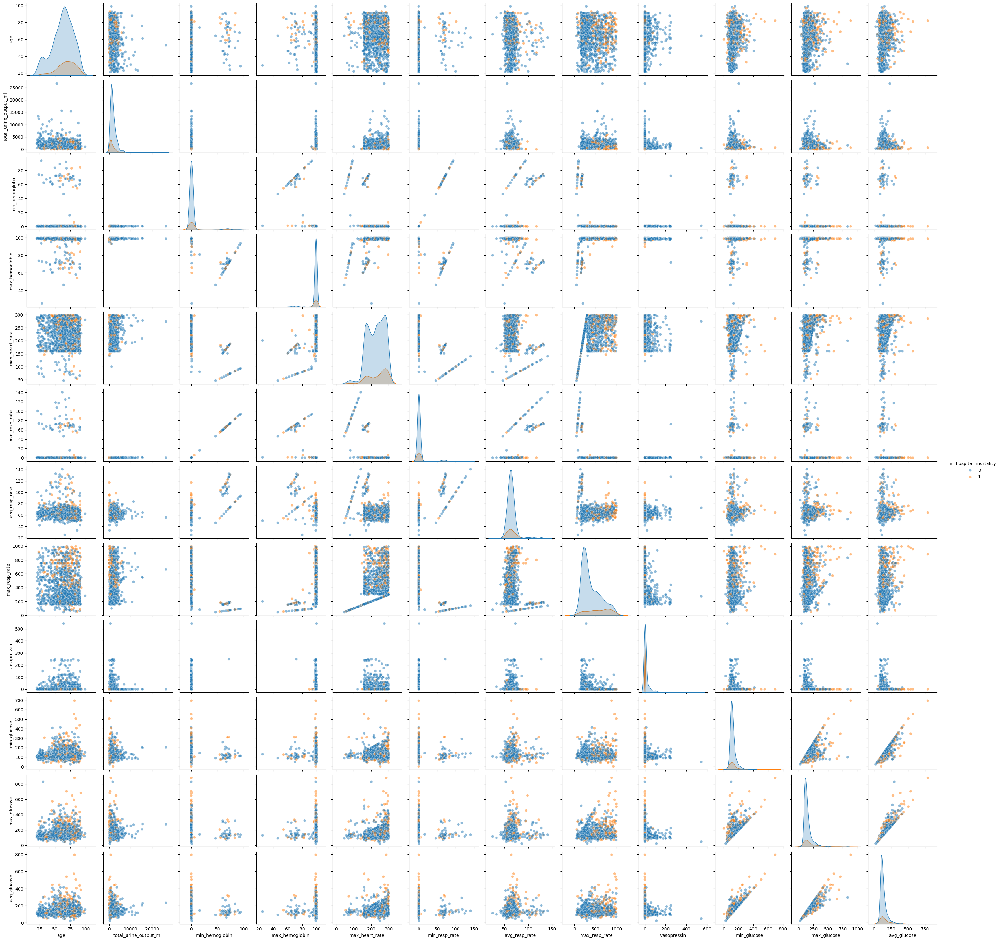

In [101]:
# categorical_variables + numerical_variables
import seaborn as sns
import matplotlib.pyplot as plt
# 假設 df 是你的資料

# 加入目標變數
features_for_plot = numerical_variables + ['in_hospital_mortality']

# 繪製 pairplot
sns.pairplot(df[features_for_plot], hue='in_hospital_mortality', plot_kws={'alpha': 0.5})
plt.show()


## t-SNE

In [102]:
import numpy as np
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.preprocessing import LabelEncoder, StandardScaler

In [103]:
features_to_use = categorical_variables + numerical_variables
df_dropna = df.dropna()
X = df_dropna[features_to_use].copy()
y = df_dropna['in_hospital_mortality']
for col in categorical_variables:
    le = LabelEncoder()
    X[col] = le.fit_transform(X[col].astype(str))

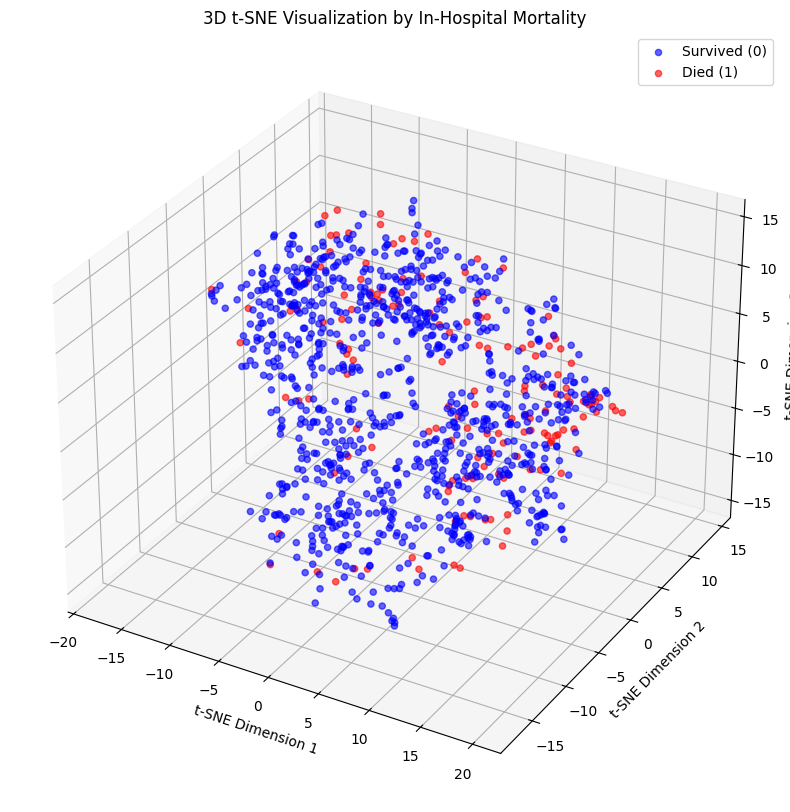

In [104]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# 2. t-SNE 降維到 3 維
tsne = TSNE(n_components=3, random_state=42, perplexity=30)
X_tsne = tsne.fit_transform(X_scaled)

# 3. 3D 視覺化
fig = plt.figure(figsize=(12, 10))
ax = fig.add_subplot(111, projection='3d')

# 繪製兩類點
ax.scatter(X_tsne[y == 0, 0], X_tsne[y == 0, 1], X_tsne[y == 0, 2],
           c='blue', label='Survived (0)', alpha=0.6)
ax.scatter(X_tsne[y == 1, 0], X_tsne[y == 1, 1], X_tsne[y == 1, 2],
           c='red', label='Died (1)', alpha=0.6)

# 標題與標籤
ax.set_title("3D t-SNE Visualization by In-Hospital Mortality")
ax.set_xlabel("t-SNE Dimension 1")
ax.set_ylabel("t-SNE Dimension 2")
ax.set_zlabel("t-SNE Dimension 3")
ax.legend()
plt.show()

## Correlation Map

In [105]:
import seaborn as sns
import matplotlib.pyplot as plt

df_encoded = pd.get_dummies(df, columns=categorical_variables, drop_first=True)
numeric_df = df_encoded.drop(columns=['subject_id', 'hadm_id', 'stay_id'])

In [106]:
# numeric_df
df_mean = numeric_df.fillna(numeric_df.mean())
df_median = numeric_df.fillna(numeric_df.median())
df_dropna = numeric_df.dropna().copy()

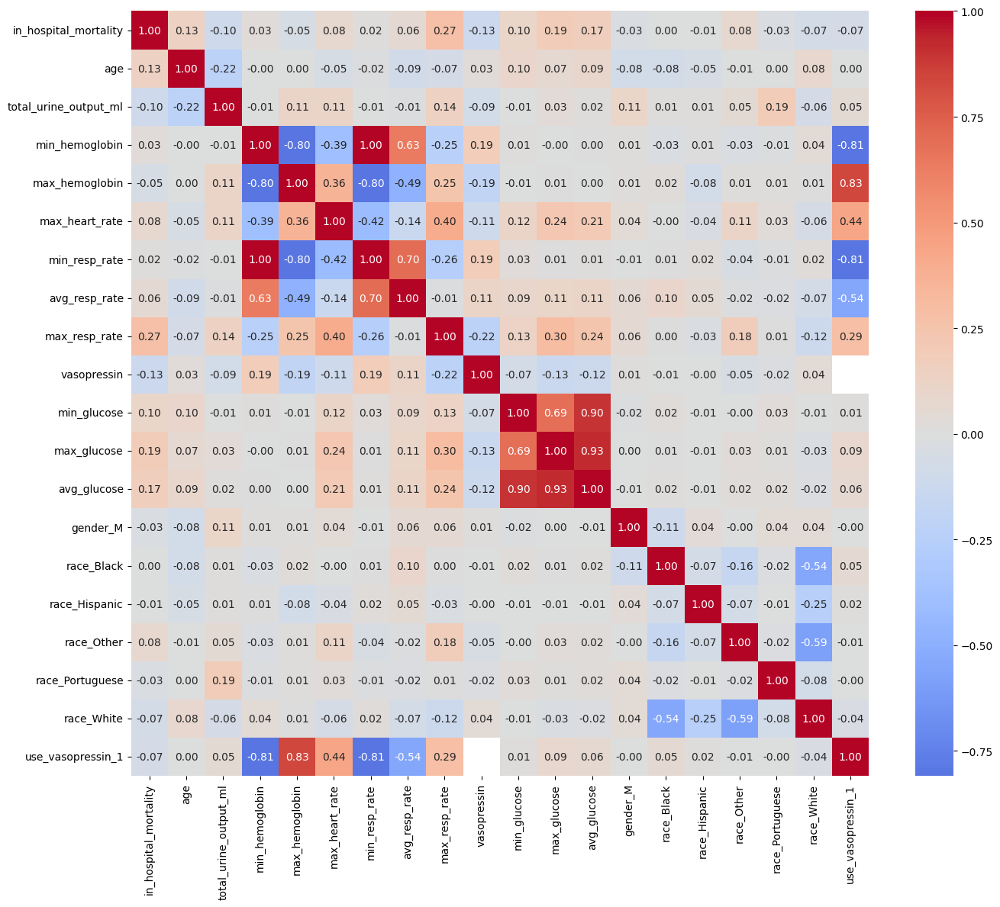

In [107]:
# 2. 計算三個相關係數矩陣
corr = numeric_df.corr()
corr_mean = df_mean.corr()
corr_median = df_median.corr()
corr_dropna = df_dropna.corr()

# 3. 繪製三張 heatmap 並排比較
plt.figure(figsize=(14, 12))
# fig, axes = plt.subplots(2, 2, figsize=(20, 16), sharey=True)

sns.heatmap(corr, annot=True, fmt=".2f",cmap='coolwarm', center=0,)# ax=axes[0,0])
# axes[0, 0].set_title("Correlation - Original (NaNs included)")

# sns.heatmap(corr_mean, annot=True, fmt=".2f",cmap='coolwarm', center=0, ax=axes[0,1])
# axes[0, 1].set_title("Correlation - NaN filled with Mean")

# sns.heatmap(corr_median, annot=True, fmt=".2f",cmap='coolwarm', center=0, ax=axes[1,0])
# axes[1, 0].set_title("Correlation - NaN filled with Median")

# sns.heatmap(corr_dropna, annot=True, fmt=".2f",cmap='coolwarm', center=0, ax=axes[1,1])
# axes[1, 1].set_title("Correlation - Rows with NaN Dropped")

plt.tight_layout()
plt.show()

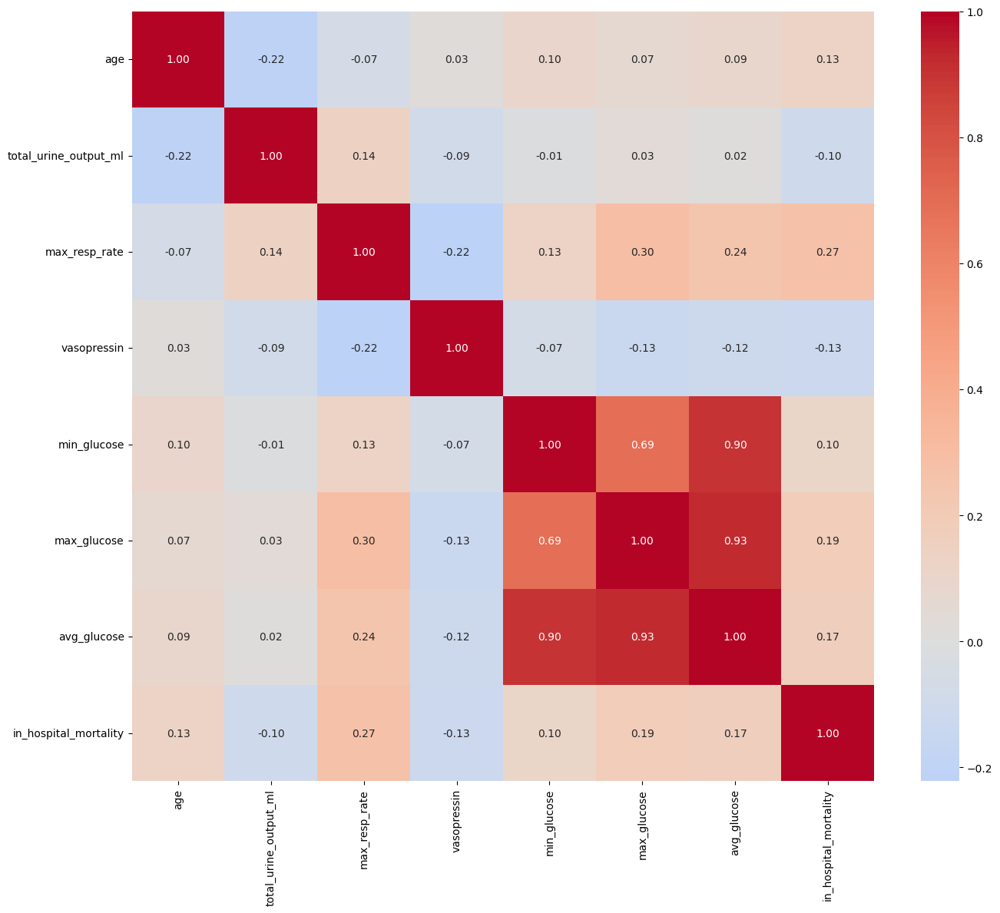

In [108]:
correlations = numeric_df.corr()['in_hospital_mortality'].drop('in_hospital_mortality')
correlations_mean = df_mean.corr()['in_hospital_mortality'].drop('in_hospital_mortality')
correlations_median = df_median.corr()['in_hospital_mortality'].drop('in_hospital_mortality')
correlations_dropna = df_dropna.corr()['in_hospital_mortality'].drop('in_hospital_mortality')

# 4. 篩選絕對相關係數大於某個閾值的欄位（例如 0.1）
threshold = 0.1
strong_corr_features = correlations[correlations.abs() > threshold].index.tolist()
strong_corr_features_mean = correlations_mean[correlations_mean.abs() > threshold].index.tolist()
strong_corr_features_median = correlations_median[correlations_median.abs() > threshold].index.tolist()
strong_corr_features_dropna = correlations_dropna[correlations_dropna.abs() > threshold].index.tolist()

# 加入目標欄位本身
features_to_plot = strong_corr_features + ['in_hospital_mortality']
features_to_plot_mean = strong_corr_features_mean + ['in_hospital_mortality']
features_to_plot_median = strong_corr_features_median + ['in_hospital_mortality']
features_to_plot_dropna = strong_corr_features_dropna + ['in_hospital_mortality']

plt.figure(figsize=(14, 12))
# fig, axes = plt.subplots(2, 2, figsize=(20, 16), sharey=True)

sns.heatmap(numeric_df[features_to_plot].corr(), annot=True, fmt=".2f",cmap='coolwarm', center=0)#, ax=axes[0,0])
# axes[0, 0].set_title("Strong Correlation - Original (NaNs included)")

# sns.heatmap(df_mean[features_to_plot_mean].corr(), annot=True, fmt=".2f",cmap='coolwarm', center=0, ax=axes[0,1])
# axes[0, 1].set_title("Strong Correlation - NaN filled with Mean")

# sns.heatmap(df_median[features_to_plot_median].corr(), annot=True, fmt=".2f",cmap='coolwarm', center=0, ax=axes[1,0])
# axes[1, 0].set_title("Strong Correlation - NaN filled with Median")

# sns.heatmap(df_dropna[features_to_plot_dropna].corr(), annot=True, fmt=".2f",cmap='coolwarm', center=0, ax=axes[1,1])
# axes[1, 1].set_title("Strong Correlation - Rows with NaN Dropped")

plt.tight_layout()
plt.show()


## Process data

### Outliers

In [109]:
def plot_groupby(df, group1, group2, variable, barplot=False, boxplot=True, violinplot=False):

    """
    This function creates two plots that compare the average values of a variable for two groups in a pandas dataframe.
    The function allows the user to choose between a bar plot, box plot, and violin plot for each group.
    The first plot compares the averages for the first group, and the second plot compares the averages for the second group.

    Inputs:
    df: pandas dataframe
    group1: string, name of the first categorical variable to group by
    group2: string, name of the second categorical variable to group by
    variable: string, name of the numerical variable to plot
    barplot: boolean, optional, default True. Whether to plot bar plots or not
    boxplot: boolean, optional, default True. Whether to plot box plots or not
    violinplot: boolean, optional, default False. Whether to plot violin plots or not

    Outputs: 
    None
    """

    avg_by_group1 = df.groupby(group1)[variable].mean()
    avg_by_group2 = df.groupby(group2)[variable].mean()

    # fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))

    if barplot:
        # Bar plot
        print('Bar Plot: ')
        ax1.bar(avg_by_group1.index, avg_by_group1.values)
        ax1.set_xlabel(group1)
        ax1.set_ylabel(f'Average {variable}')
        ax2.bar(avg_by_group2.index, avg_by_group2.values)
        ax2.set_xlabel(group2)
        ax2.set_ylabel(f'Average {variable}')
        plt.show()

    if boxplot:
        # Create box plots to visualize the distribution of SaO2 values by gender and ethnicity
        print(f'Box Plot: {variable}')
        sns.boxplot(x=group1, y=variable, hue=group2, data=df)
        plt.show()

    if violinplot:
        print('Violin Plot: ')
        sns.violinplot(x=group1, y=variable, hue=group2, data=df)
        plt.show()

Box Plot: age


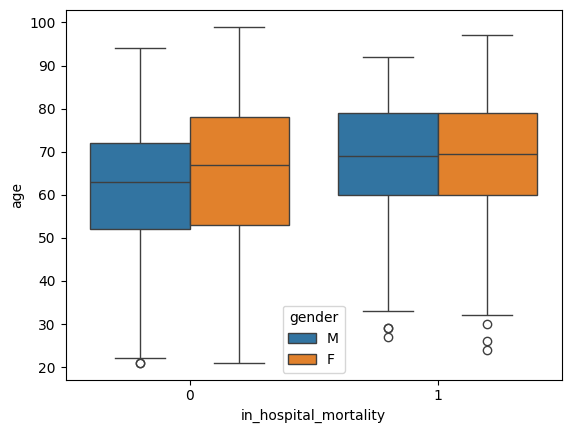

Box Plot: total_urine_output_ml


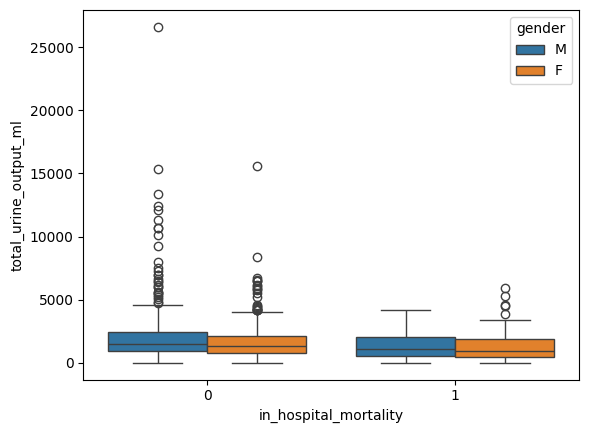

Box Plot: min_hemoglobin


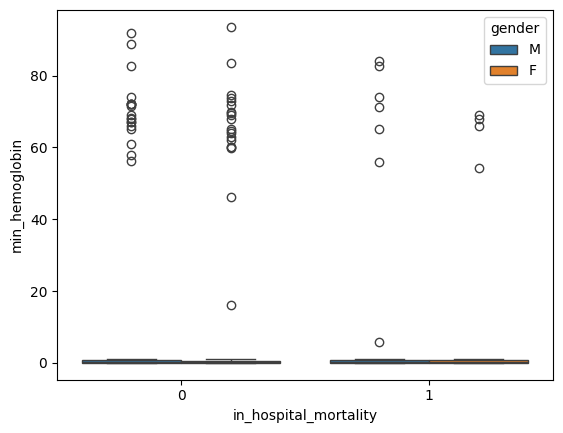

Box Plot: max_hemoglobin


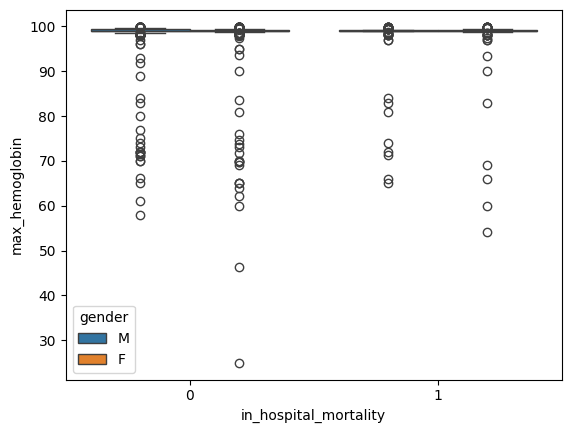

Box Plot: max_heart_rate


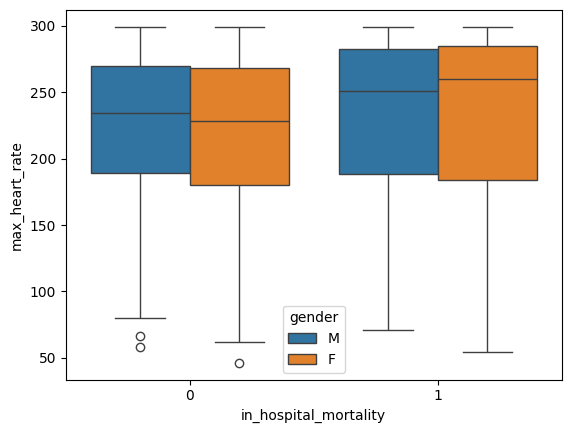

Box Plot: min_resp_rate


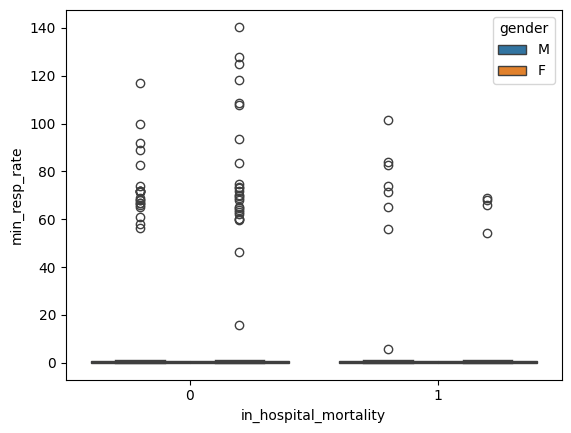

Box Plot: avg_resp_rate


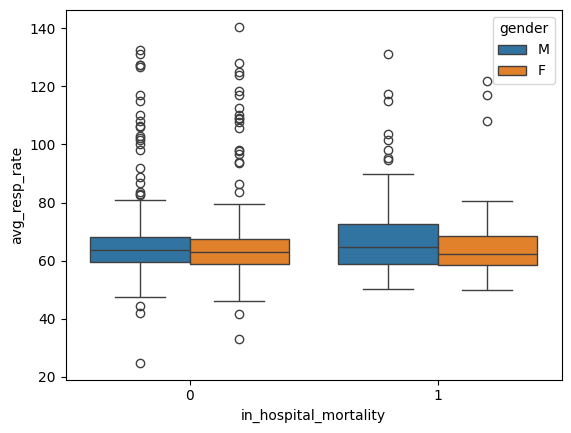

Box Plot: max_resp_rate


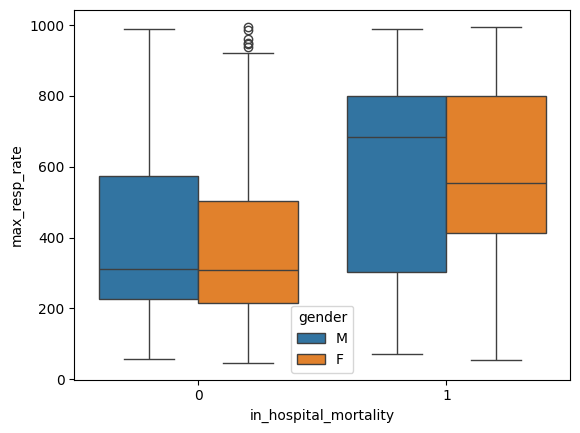

Box Plot: vasopressin


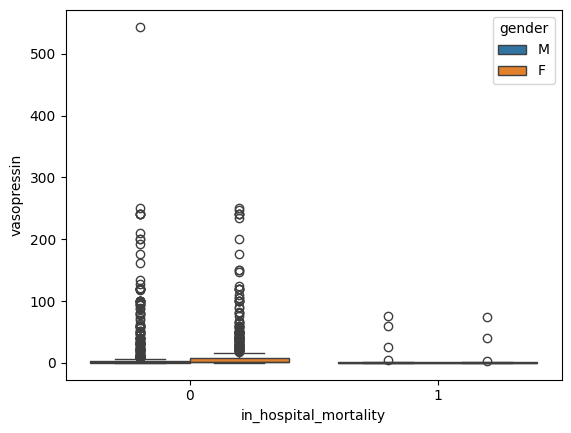

Box Plot: min_glucose


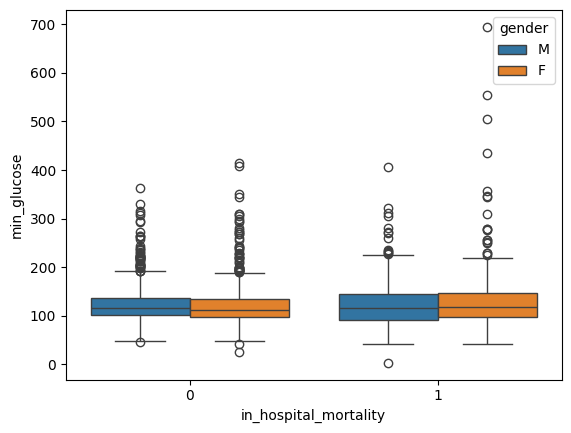

Box Plot: max_glucose


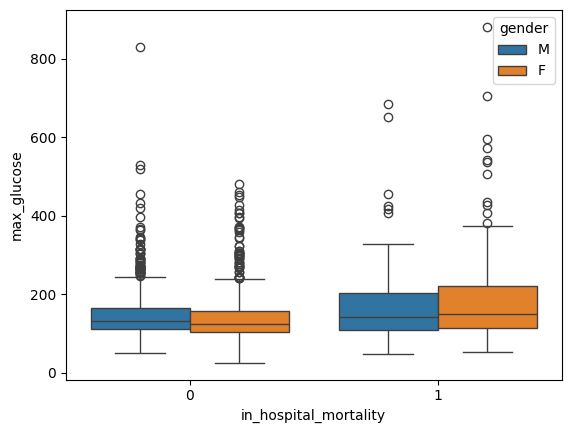

Box Plot: avg_glucose


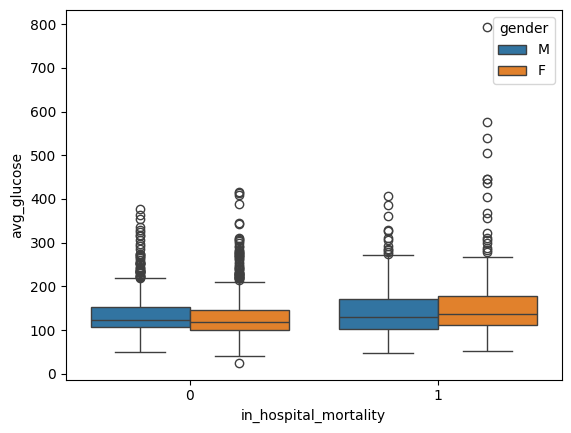

In [110]:
'''
Use logic to filter out the impossible value of each columns
age > 90
total_urine_output_ml > 10000
max_glucose > 600
max_heart_rate < 60
'''
for col in numerical_variables:
    plot_groupby(data, group1='in_hospital_mortality', group2='gender', variable=col)

In [111]:
# mask = (
#     ((df['age'] > 90) & df['age'].notna()) |
#     ((df['total_urine_output_ml'] > 10000) & df['total_urine_output_ml'].notna()) |
#     ((df['vasopressin'] > 200) & df['vasopressin'].notna()) |
#     (((df['combined_max_glucose'] > 900)) & df['combined_max_glucose'].notna()) |
#     ((df['max_heart_rate'] < 70) & df['max_heart_rate'].notna())
# )

# # 刪除滿足這些條件的 row
# df_cleaned = df[~mask].copy()
df_cleaned = df.copy()
# df_cleaned.loc[(df['age'] > 90), 'age'] = np.nan
df_cleaned = df_cleaned[df_cleaned['age'] < 90]
df_cleaned.loc[(df_cleaned['total_urine_output_ml'] > 5000), 'total_urine_output_ml'] = np.nan
df_cleaned.loc[(df_cleaned['max_glucose'] > 600), 'max_glucose'] = np.nan
df_cleaned.loc[(df_cleaned['min_glucose'] > 600), 'min_glucose'] = np.nan
df_cleaned.loc[(df_cleaned['avg_glucose'] > 600), 'avg_glucose'] = np.nan
df_cleaned.loc[(df_cleaned['vasopressin'] > 100), 'vasopressin'] = np.nan

In [112]:
df_cleaned.describe()

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,min_glucose,max_glucose,avg_glucose,use_vasopressin
count,1.675000e+03,1.675000e+03,1.675000e+03,1675.000000,1675.000000,1062.000000,1195.000000,1195.000000,1204.000000,1204.000000,1204.000000,1204.000000,1096.000000,1605.000000,1602.000000,1605.000000,1675.000000
mean,1.496755e+07,2.506287e+07,3.496366e+07,0.164179,62.538507,1570.402072,2.875963,97.851548,228.670349,3.723568,65.063140,421.774668,7.887847,125.441121,150.836454,138.086434,0.677612
std,2.937874e+06,2.850376e+06,2.904211e+06,0.370549,16.086056,1030.028540,13.132972,6.212931,50.108638,16.365658,11.390011,238.307696,18.810300,48.376882,70.217833,55.976852,0.467530
min,1.001527e+07,2.001150e+07,3.000250e+07,0.000000,21.000000,0.000000,0.010000,25.000000,46.300000,0.010000,24.866667,46.300000,0.000000,3.000000,25.000000,25.000000,0.000000
25%,1.243452e+07,2.265077e+07,3.247756e+07,0.000000,53.000000,796.250000,0.020000,99.000000,187.000000,0.020000,59.124696,228.000000,0.175960,98.000000,108.000000,104.000000,0.000000
50%,1.481419e+07,2.506764e+07,3.502453e+07,0.000000,65.000000,1330.000000,0.190000,99.000000,234.650000,0.200000,63.537556,343.100000,1.000000,114.000000,130.000000,123.000000,1.000000
75%,1.765335e+07,2.748116e+07,3.741249e+07,0.000000,75.000000,2142.500000,0.700000,99.300000,273.000000,0.700000,68.116333,593.250000,2.000000,138.000000,167.000000,152.500000,1.000000
max,1.999678e+07,2.999533e+07,3.999687e+07,1.000000,89.000000,4805.000000,93.600000,99.900000,299.200000,140.500000,140.500000,995.000000,100.000000,554.000000,596.000000,575.000000,1.000000


Box Plot: age


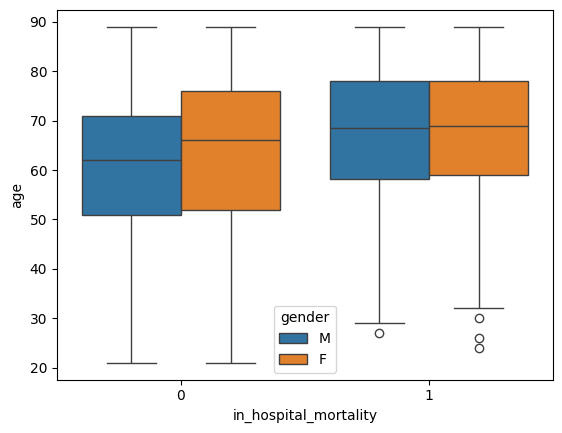

Box Plot: total_urine_output_ml


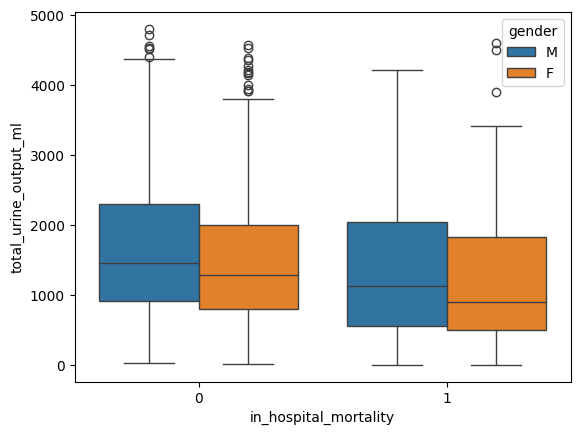

Box Plot: min_hemoglobin


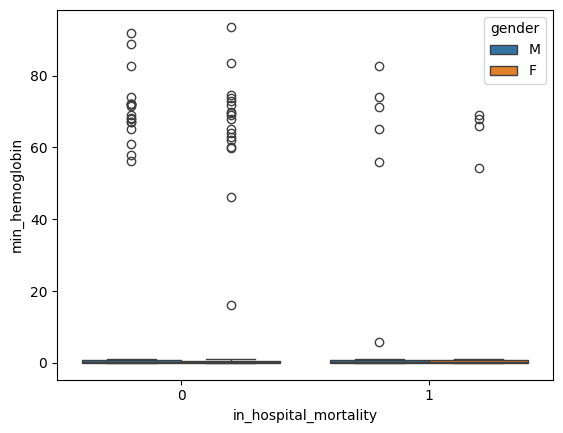

Box Plot: max_hemoglobin


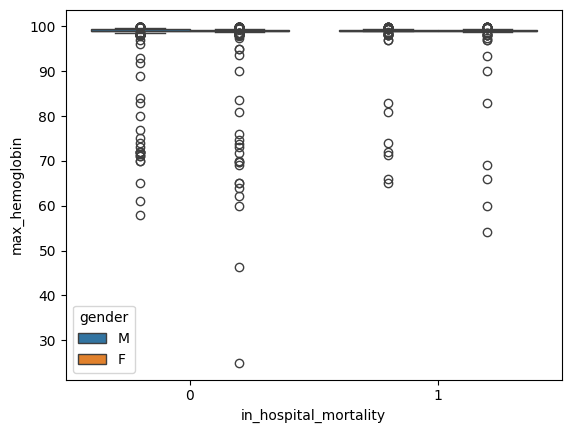

Box Plot: max_heart_rate


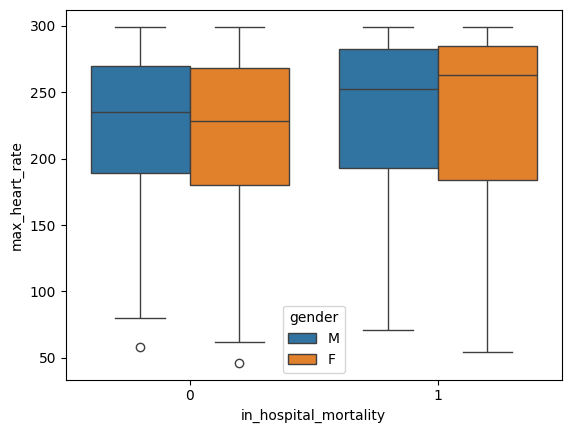

Box Plot: min_resp_rate


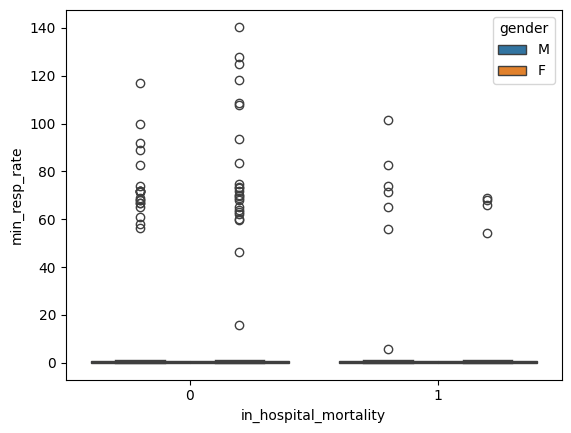

Box Plot: avg_resp_rate


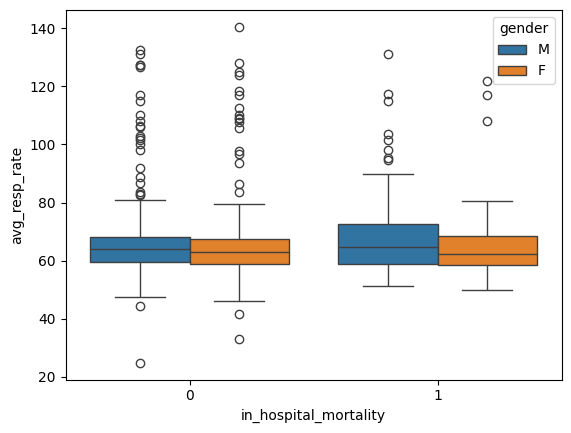

Box Plot: max_resp_rate


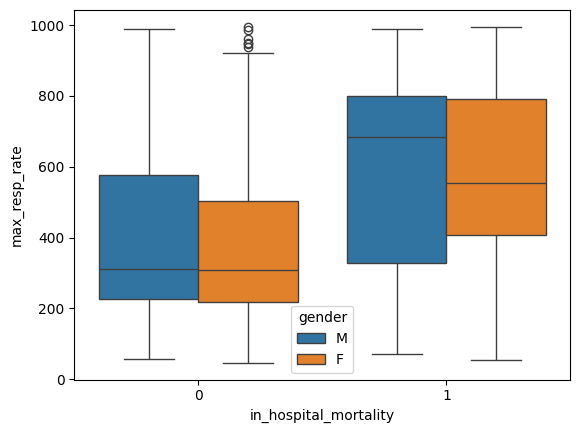

Box Plot: vasopressin


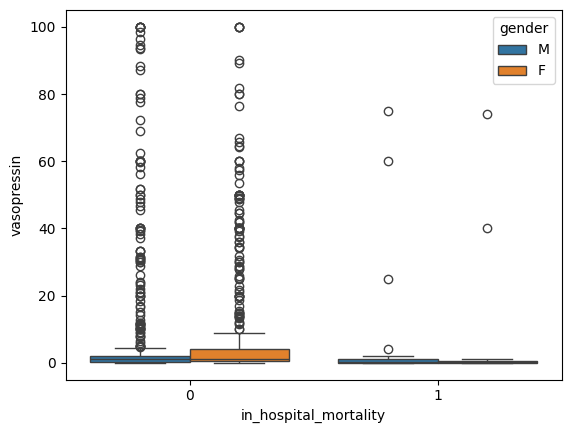

Box Plot: min_glucose


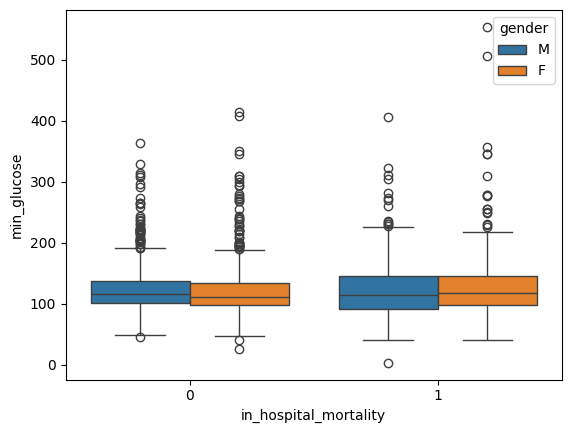

Box Plot: max_glucose


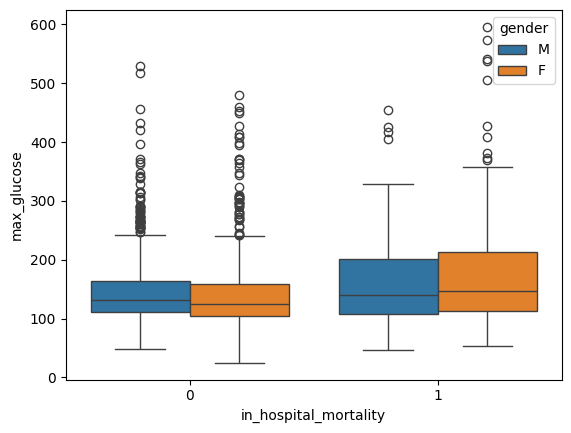

Box Plot: avg_glucose


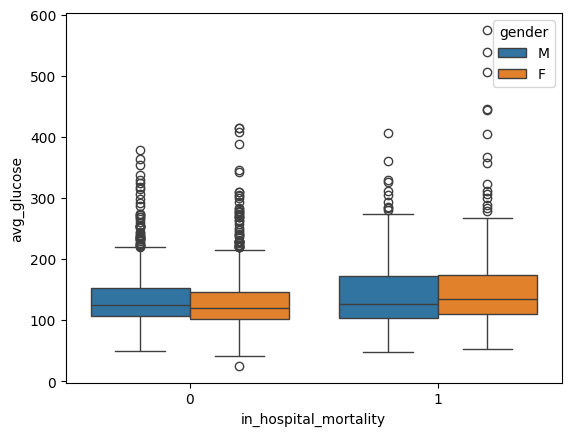

In [113]:
for col in numerical_variables:
    plot_groupby(df_cleaned, group1='in_hospital_mortality', group2='gender', variable=col)

### Z-score

In [114]:
from scipy.stats import zscore

# zscore() ignores non-numeric dtypes automatically
z = df_cleaned[numerical_variables].apply(zscore)

In [115]:
outlier_mask = (z.abs() >= 3).any(axis=1)   # True if any feature is an outlier
df_outliers   = df_cleaned[outlier_mask]           # only outliers
df_clean      = df_cleaned[~outlier_mask]          # data with outliers removed

### Missing value with K-Nearest Neighbors

In [116]:
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler, LabelEncoder

In [117]:
for col in categorical_variables:
    df_cleaned[col] = LabelEncoder().fit_transform(df_clean[col].astype(str))
df_class_0 = df_cleaned[df_cleaned['in_hospital_mortality'] == 0]
df_class_1 = df_cleaned[df_cleaned['in_hospital_mortality'] == 1]

# 各自填補
imputer = KNNImputer(n_neighbors=5)
df_class_0_imputed = pd.DataFrame(
    imputer.fit_transform(df_class_0),
    columns=df_class_0.columns,
    index=df_class_0.index
)
df_class_1_imputed = pd.DataFrame(
    imputer.fit_transform(df_class_1),
    columns=df_class_1.columns,
    index=df_class_1.index
)

# 合併
df_imputed = pd.concat([df_class_0_imputed, df_class_1_imputed]).sort_index()
# knn_imp = KNNImputer(n_neighbors=5)
# df_imputed = pd.DataFrame(
#     knn_imp.fit_transform(df_cleaned),
#     columns=df_cleaned.columns,
#     index=df_cleaned.index
# )

In [118]:
df_class_0

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,gender,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,race,min_glucose,max_glucose,avg_glucose,use_vasopressin
0,10711349,25928774,39575548,0,49,1,2250.0,0.70,99.0,287.0,0.70,62.027502,287.0,88.43537,1,95.0,95.0,95.0,1
1,17414299,28050324,39821107,0,57,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,122.0,124.0,123.0,0
2,18553288,21713414,37661257,0,80,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,5,201.0,206.0,203.5,0
3,19291839,20773333,37533185,0,25,1,2200.0,0.08,99.4,230.0,0.08,59.026823,230.0,1.00000,3,97.0,104.0,100.5,1
4,13141943,20806200,39725789,0,47,1,1550.0,0.60,99.0,219.9,0.60,60.974194,219.9,2.00000,5,111.0,163.0,137.0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1730,16614777,29435002,31237667,0,25,0,3405.0,0.25,99.6,184.0,0.25,41.791975,445.0,0.50000,5,141.0,141.0,141.0,1
1732,14412915,27145067,32411992,0,74,0,945.0,0.33,99.0,265.0,0.33,64.341534,552.0,0.02667,5,141.0,141.0,141.0,1
1733,18535260,27121275,31414946,0,29,0,1250.0,0.41,99.1,296.0,0.41,58.507793,550.0,0.50000,5,91.0,142.0,112.0,1
1734,19544330,25186323,32438211,0,42,1,2770.0,0.40,99.0,287.0,0.40,63.999387,763.0,1.00000,5,100.0,105.0,103.0,1


In [119]:
df.describe()

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,min_glucose,max_glucose,avg_glucose,use_vasopressin
count,1.736000e+03,1.736000e+03,1.736000e+03,1736.000000,1736.000000,1137.000000,1236.000000,1236.000000,1245.000000,1245.000000,1245.000000,1245.000000,1170.000000,1662.000000,1662.000000,1662.000000,1736.000000
mean,1.497891e+07,2.504886e+07,3.499544e+07,0.167627,63.555876,1801.346526,3.010175,97.796521,228.065060,3.828896,64.968114,420.393253,13.643504,125.790614,152.891697,138.683479,0.673963
std,2.943247e+06,2.847673e+06,2.915910e+06,0.373642,16.679356,1771.444148,13.462807,6.311014,50.309687,16.528915,11.381507,238.424048,39.006714,50.435199,77.625866,58.457478,0.468896
min,1.001527e+07,2.001150e+07,3.000250e+07,0.000000,21.000000,0.000000,0.010000,25.000000,46.300000,0.010000,24.866667,46.300000,0.000000,3.000000,25.000000,25.000000,0.000000
25%,1.244207e+07,2.263785e+07,3.249838e+07,0.000000,54.000000,800.000000,0.020000,99.000000,185.000000,0.020000,59.008272,226.000000,0.201173,98.000000,108.000000,104.270833,0.000000
50%,1.483727e+07,2.505770e+07,3.505184e+07,0.000000,65.000000,1350.000000,0.190000,99.000000,234.000000,0.200000,63.396842,343.000000,1.000000,114.000000,131.000000,123.000000,1.000000
75%,1.768229e+07,2.747245e+07,3.748562e+07,0.000000,76.000000,2275.000000,0.700000,99.200000,273.000000,0.700000,68.064259,591.000000,2.000000,137.750000,168.000000,152.458333,1.000000
max,1.999678e+07,2.999533e+07,3.999687e+07,1.000000,99.000000,26615.000000,93.600000,99.900000,299.200000,140.500000,140.500000,995.000000,543.749979,695.000000,882.000000,794.000000,1.000000


In [120]:
df_clean.describe()

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,min_glucose,max_glucose,avg_glucose,use_vasopressin
count,1.675000e+03,1.675000e+03,1.675000e+03,1675.000000,1675.000000,1062.000000,1195.000000,1195.000000,1204.000000,1204.000000,1204.000000,1204.000000,1096.000000,1605.000000,1602.000000,1605.000000,1675.000000
mean,1.496755e+07,2.506287e+07,3.496366e+07,0.164179,62.538507,1570.402072,2.875963,97.851548,228.670349,3.723568,65.063140,421.774668,7.887847,125.441121,150.836454,138.086434,0.677612
std,2.937874e+06,2.850376e+06,2.904211e+06,0.370549,16.086056,1030.028540,13.132972,6.212931,50.108638,16.365658,11.390011,238.307696,18.810300,48.376882,70.217833,55.976852,0.467530
min,1.001527e+07,2.001150e+07,3.000250e+07,0.000000,21.000000,0.000000,0.010000,25.000000,46.300000,0.010000,24.866667,46.300000,0.000000,3.000000,25.000000,25.000000,0.000000
25%,1.243452e+07,2.265077e+07,3.247756e+07,0.000000,53.000000,796.250000,0.020000,99.000000,187.000000,0.020000,59.124696,228.000000,0.175960,98.000000,108.000000,104.000000,0.000000
50%,1.481419e+07,2.506764e+07,3.502453e+07,0.000000,65.000000,1330.000000,0.190000,99.000000,234.650000,0.200000,63.537556,343.100000,1.000000,114.000000,130.000000,123.000000,1.000000
75%,1.765335e+07,2.748116e+07,3.741249e+07,0.000000,75.000000,2142.500000,0.700000,99.300000,273.000000,0.700000,68.116333,593.250000,2.000000,138.000000,167.000000,152.500000,1.000000
max,1.999678e+07,2.999533e+07,3.999687e+07,1.000000,89.000000,4805.000000,93.600000,99.900000,299.200000,140.500000,140.500000,995.000000,100.000000,554.000000,596.000000,575.000000,1.000000


In [121]:
# df_imputed.describe()

## EDA after preprocess

### Pairplot

Clean outliers


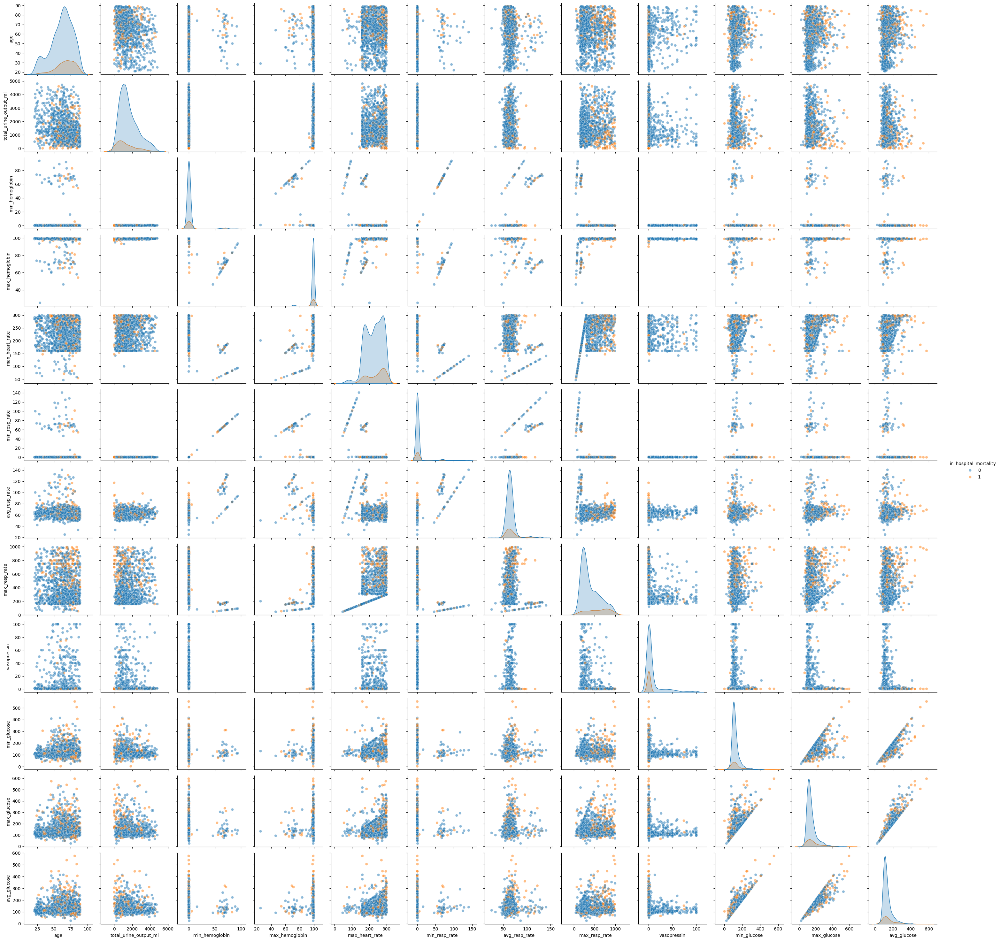

Fill in missing


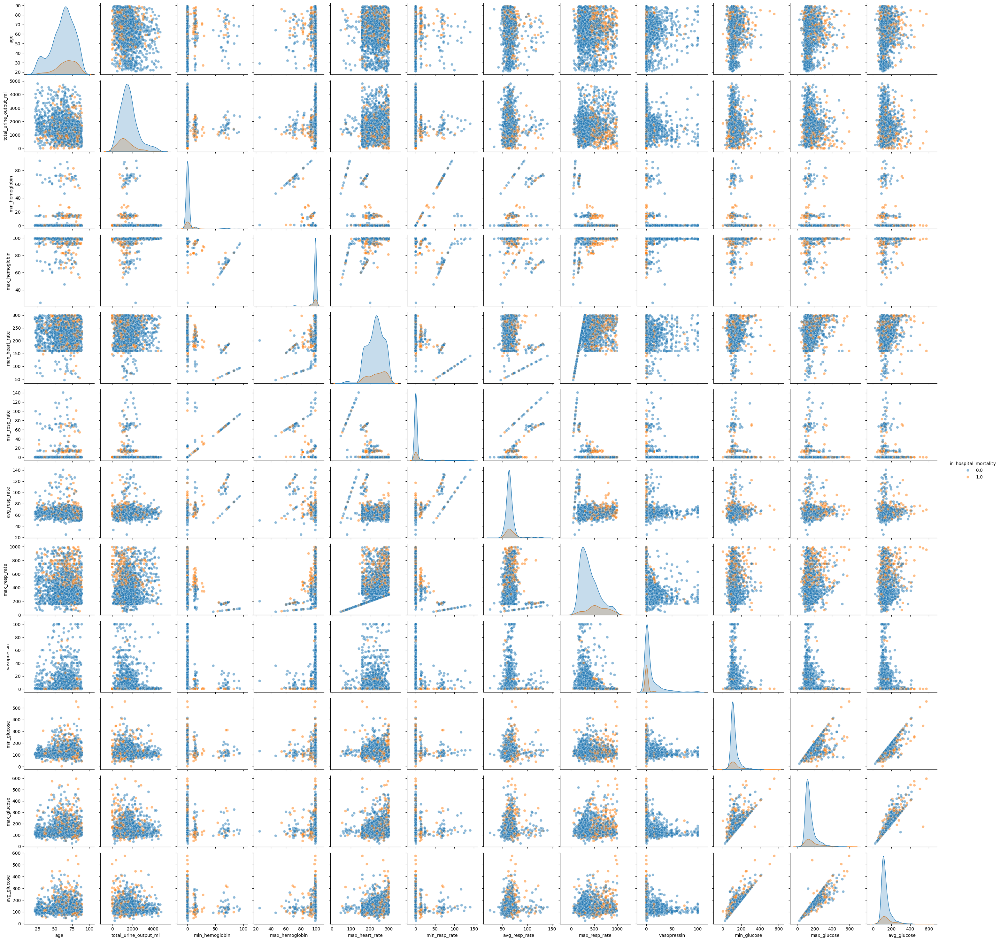

In [122]:
import seaborn as sns
import matplotlib.pyplot as plt

features_for_plot = numerical_variables + ['in_hospital_mortality']


print("Clean outliers")
sns.pairplot(df_cleaned[features_for_plot], hue='in_hospital_mortality', plot_kws={'alpha': 0.5})
plt.show()

print("Fill in missing")
sns.pairplot(df_imputed[features_for_plot], hue='in_hospital_mortality', plot_kws={'alpha': 0.5})
plt.show()



### Correlation Map

In [123]:
import seaborn as sns
import matplotlib.pyplot as plt

df_encoded_clean = pd.get_dummies(df_clean, columns=categorical_variables, drop_first=True)
numeric_df_clean = df_encoded_clean.drop(columns=['subject_id', 'hadm_id', 'stay_id'])

df_encoded = pd.get_dummies(df_imputed, columns=categorical_variables, drop_first=True)
numeric_df = df_encoded.drop(columns=['subject_id', 'hadm_id', 'stay_id'])

Clean outliers


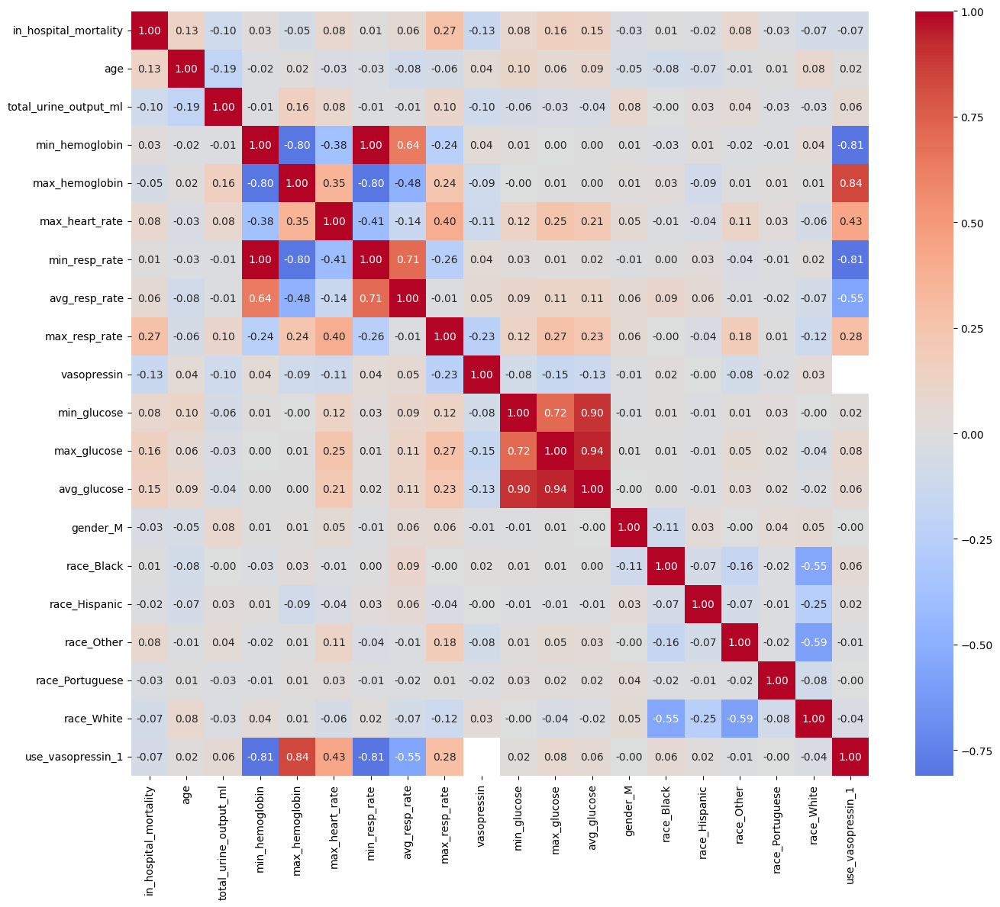

Fill in missing


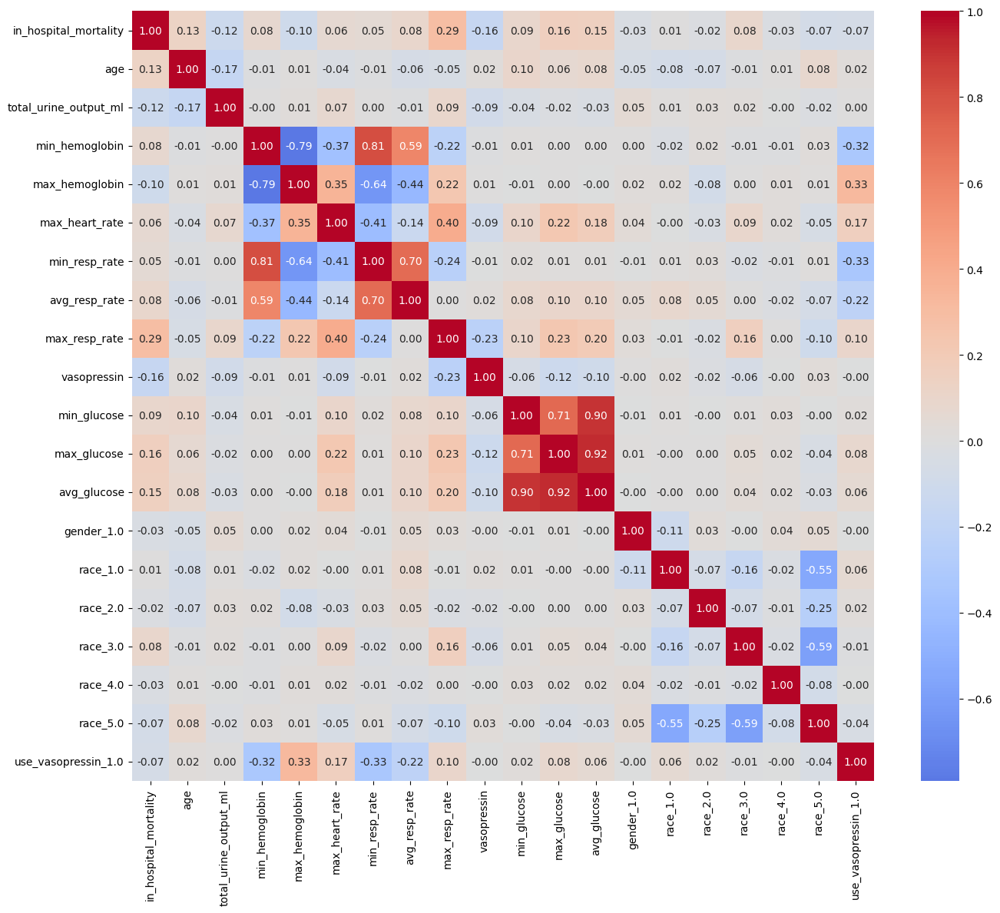

In [124]:
print("Clean outliers")
corr_clean = numeric_df_clean.corr()

plt.figure(figsize=(14, 12))
sns.heatmap(corr_clean, annot=True, fmt=".2f",cmap='coolwarm', center=0,)# ax=axes[0,0])
plt.tight_layout()
plt.show()

print("Fill in missing")
corr = numeric_df.corr()

plt.figure(figsize=(14, 12))
sns.heatmap(corr, annot=True, fmt=".2f",cmap='coolwarm', center=0,)# ax=axes[0,0])
plt.tight_layout()
plt.show()

Clean outliers


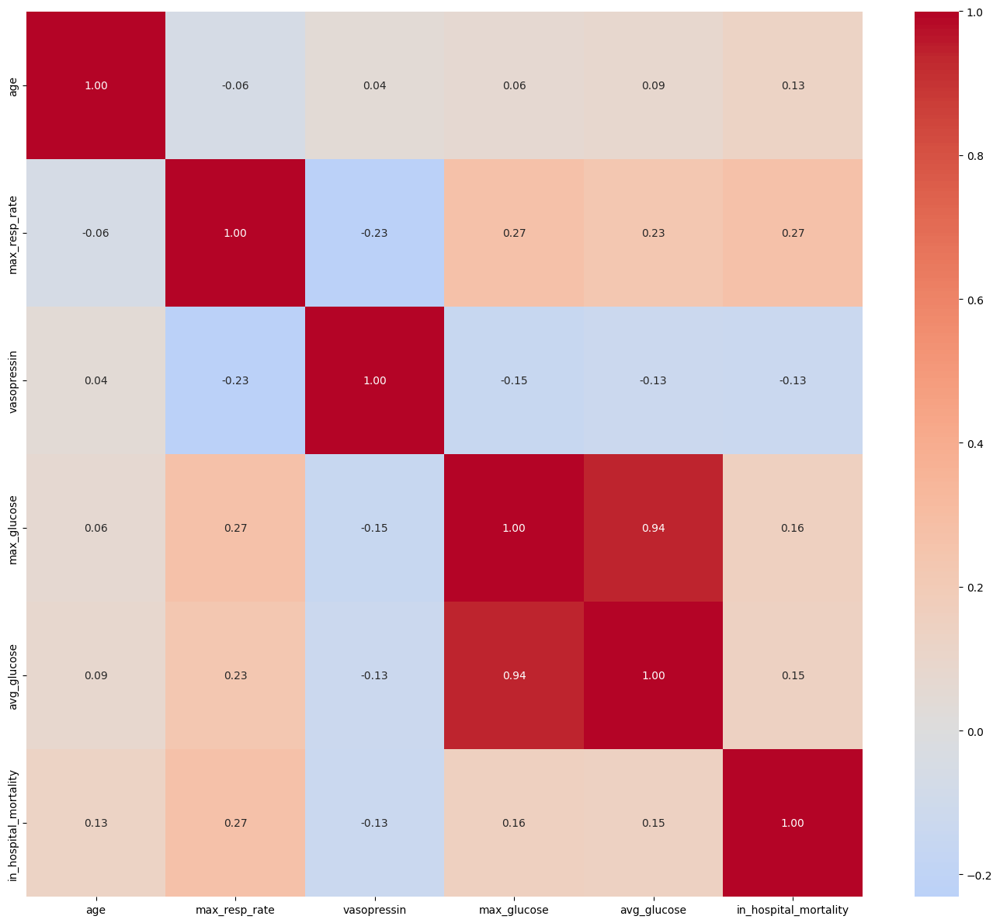

Fill in missing


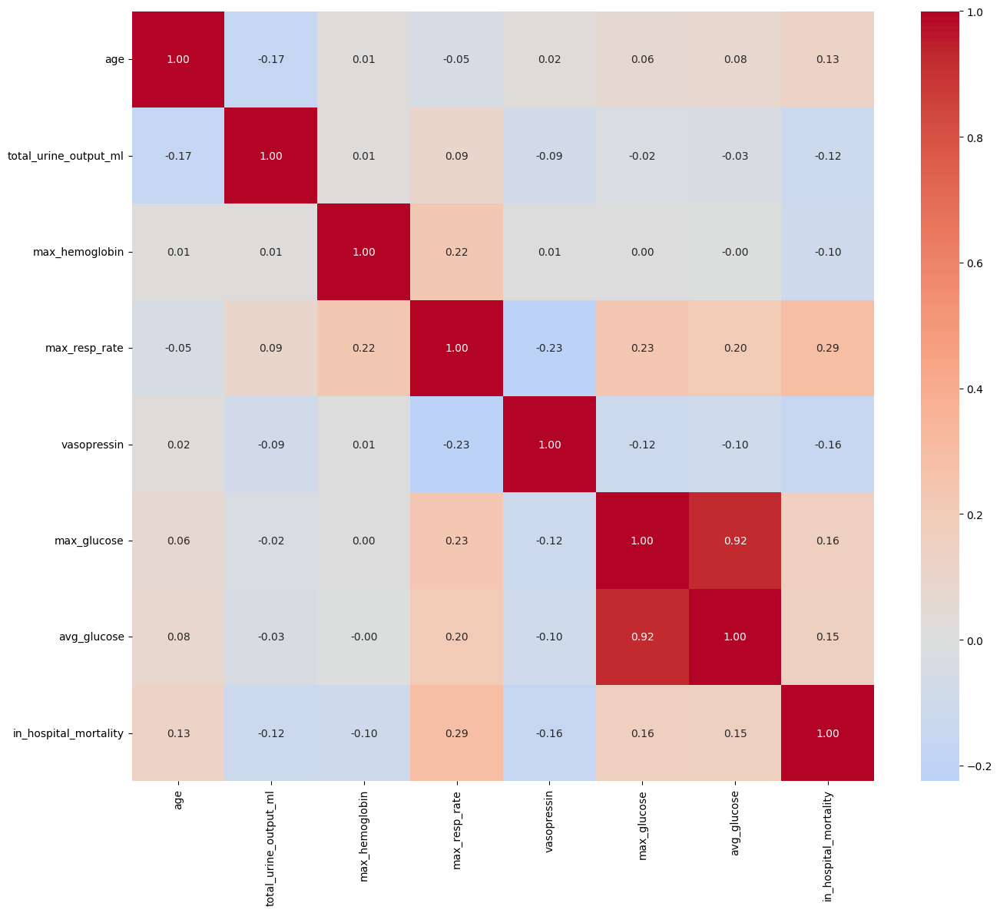

In [125]:
print("Clean outliers")
correlations_clean = numeric_df_clean.corr()['in_hospital_mortality'].drop('in_hospital_mortality')

threshold = 0.1
strong_corr_features_clean = correlations_clean[correlations_clean.abs() > threshold].index.tolist()

# 加入目標欄位本身
features_to_plot_clean = strong_corr_features_clean + ['in_hospital_mortality']

plt.figure(figsize=(14, 12))
sns.heatmap(numeric_df_clean[features_to_plot_clean].corr(), annot=True, fmt=".2f",cmap='coolwarm', center=0)
plt.tight_layout()
plt.show()

print("Fill in missing")
correlations = numeric_df.corr()['in_hospital_mortality'].drop('in_hospital_mortality')

# threshold = 0.1
strong_corr_features = correlations[correlations.abs() > threshold].index.tolist()

# 加入目標欄位本身
features_to_plot = strong_corr_features + ['in_hospital_mortality']

plt.figure(figsize=(14, 12))
sns.heatmap(numeric_df[features_to_plot].corr(), annot=True, fmt=".2f",cmap='coolwarm', center=0)
plt.tight_layout()
plt.show()


## Distribution of each features

### Before preprocess

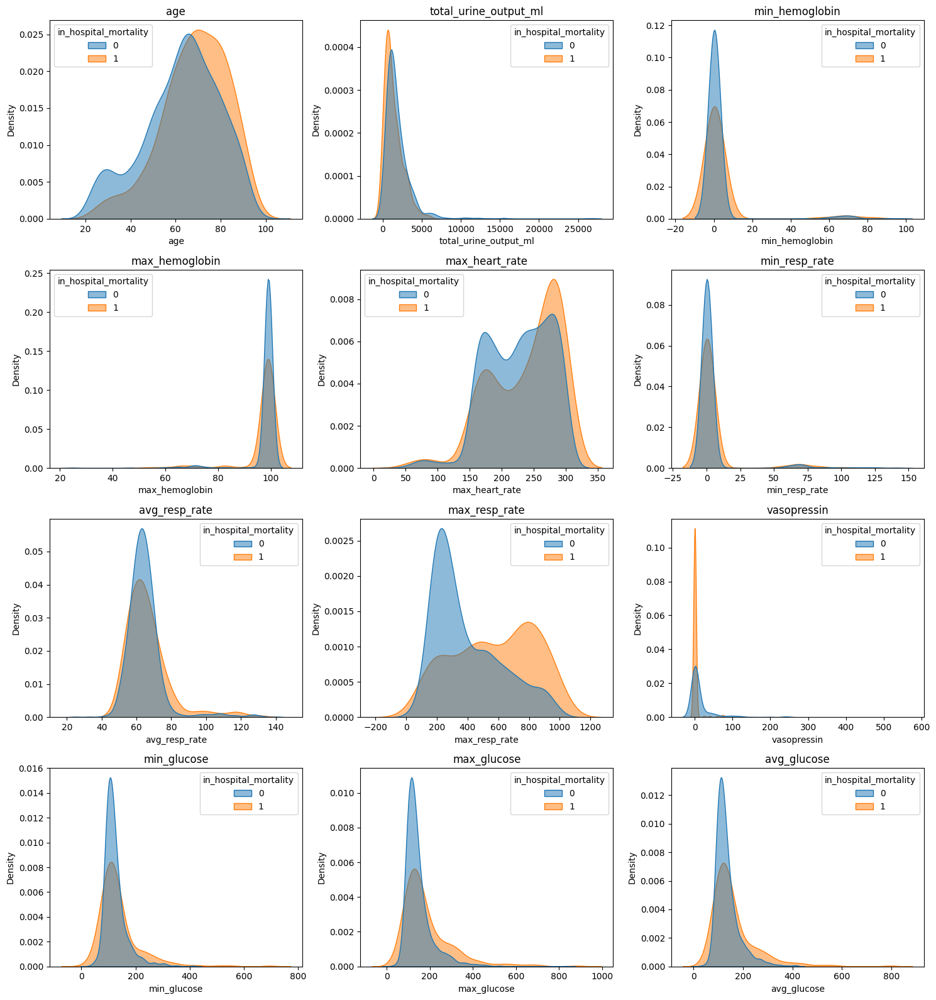

In [126]:
import math
n_cols = 3 
n_rows = math.ceil(len(numerical_variables) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
axes = axes.flatten()   

for ax, col in zip(axes, numerical_variables):
    sns.kdeplot(
        data=df, x=col, hue='in_hospital_mortality',
        common_norm=False, fill=True, ax=ax, alpha=0.5
    )
    ax.set_title(col)


for ax in axes[len(numerical_variables):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

### After preprocess

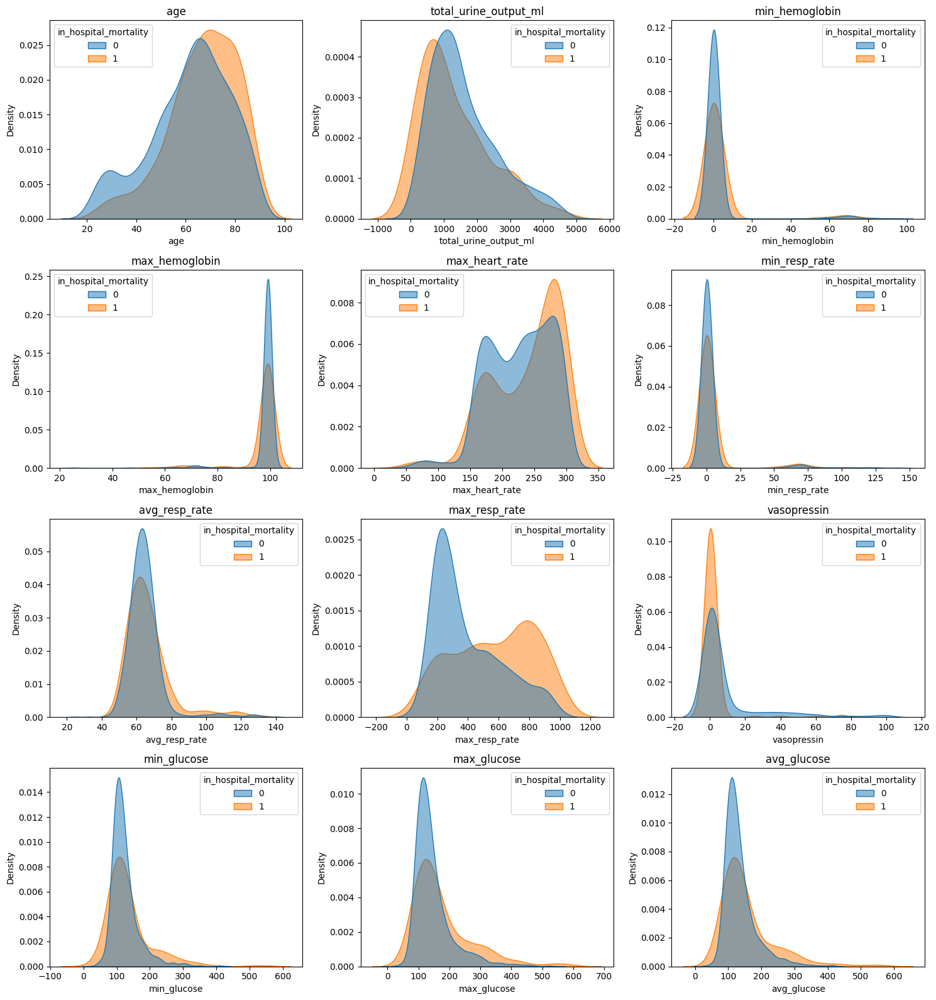

In [127]:
import math
n_cols = 3 
n_rows = math.ceil(len(numerical_variables) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
axes = axes.flatten()   

for ax, col in zip(axes, numerical_variables):
    sns.kdeplot(
        data=df_cleaned, x=col, hue='in_hospital_mortality',
        common_norm=False, fill=True, ax=ax, alpha=0.5
    )
    ax.set_title(col)

# 若有多餘空格，隱藏
for ax in axes[len(numerical_variables):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

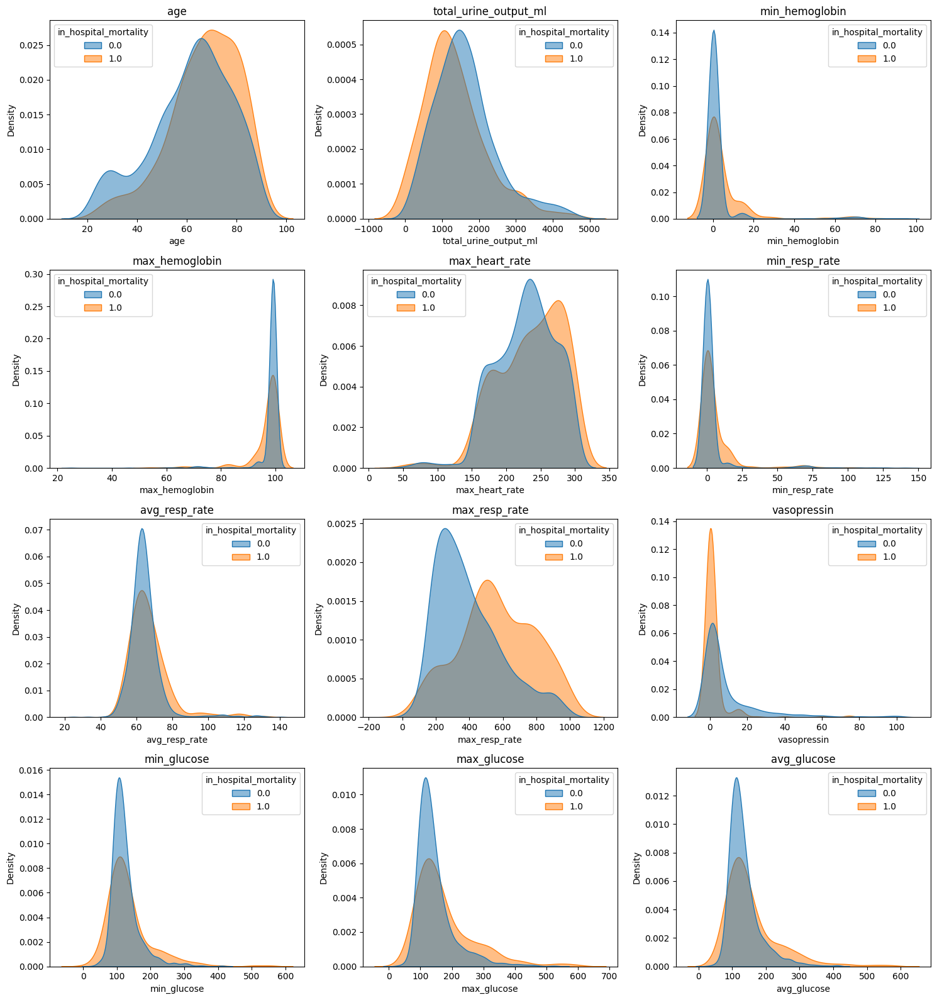

In [128]:
import math
n_cols = 3 
n_rows = math.ceil(len(numerical_variables) / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
axes = axes.flatten()   

for ax, col in zip(axes, numerical_variables):
    sns.kdeplot(
        data=df_imputed, x=col, hue='in_hospital_mortality',
        common_norm=False, fill=True, ax=ax, alpha=0.5
    )
    ax.set_title(col)

# 若有多餘空格，隱藏
for ax in axes[len(numerical_variables):]:
    ax.set_visible(False)

plt.tight_layout()
plt.show()

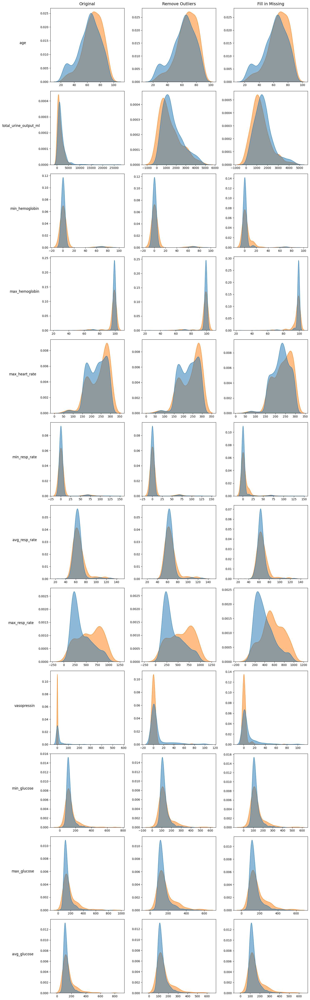

In [129]:
datasets = {
    'Original': df,
    'Remove Outliers': df_cleaned,
    'Fill in Missing': df_imputed
}

n_cols = len(datasets)    # 3
n_rows = len(numerical_variables)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))

for r, feature in enumerate(numerical_variables):
    for c, (name, data) in enumerate(datasets.items()):
        ax = axes[r, c]
        sns.kdeplot(
            data=data,
            x=feature,
            hue='in_hospital_mortality',
            common_norm=False,   
            fill=True,
            alpha=0.5,
            ax=ax
        )
        ax.set_ylabel('')
        ax.set_xlabel('')
        if r == 0:                   
            ax.set_title(name, fontsize=14, pad=10)
        if c == 0:                    
            ax.set_ylabel(feature, rotation=0, labelpad=60, fontsize=12)
        else:
            ax.set_ylabel('')

# handles, labels = axes[0,0].get_legend_handles_labels()
# fig.legend(handles, labels, loc='upper right', bbox_to_anchor=(0.98, 0.98))
for ax in axes.flatten():
    ax.legend_.remove()

plt.tight_layout()   
plt.show()

In [130]:
df_imputed

,subject_id,hadm_id,stay_id,in_hospital_mortality,age,gender,total_urine_output_ml,min_hemoglobin,max_hemoglobin,max_heart_rate,min_resp_rate,avg_resp_rate,max_resp_rate,vasopressin,race,min_glucose,max_glucose,avg_glucose,use_vasopressin
0,10711349.0,25928774.0,39575548.0,0.0,49.0,1.0,2250.0,0.700,99.00,287.00,0.700,62.027502,287.0,88.435370,1.0,95.0,95.0,95.000000,1.0
1,17414299.0,28050324.0,39821107.0,0.0,57.0,0.0,1324.0,0.142,99.04,268.36,0.142,61.038071,451.4,13.440000,5.0,122.0,124.0,123.000000,0.0
2,18553288.0,21713414.0,37661257.0,0.0,80.0,0.0,1953.4,0.446,99.08,206.20,0.446,61.473883,231.6,7.901354,5.0,201.0,206.0,203.500000,0.0
3,19291839.0,20773333.0,37533185.0,0.0,25.0,1.0,2200.0,0.080,99.40,230.00,0.080,59.026823,230.0,1.000000,3.0,97.0,104.0,100.500000,1.0
4,13141943.0,20806200.0,39725789.0,0.0,47.0,1.0,1550.0,0.600,99.00,219.90,0.600,60.974194,219.9,2.000000,5.0,111.0,163.0,137.000000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1731,19995127.0,27369164.0,32899958.0,1.0,83.0,1.0,525.0,0.600,98.20,187.00,0.600,66.998039,304.0,1.000000,1.0,91.0,92.0,91.500000,1.0
1732,14412915.0,27145067.0,32411992.0,0.0,74.0,0.0,945.0,0.330,99.00,265.00,0.330,64.341534,552.0,0.026670,5.0,141.0,141.0,141.000000,1.0
1733,18535260.0,27121275.0,31414946.0,0.0,29.0,0.0,1250.0,0.410,99.10,296.00,0.410,58.507793,550.0,0.500000,5.0,91.0,142.0,112.000000,1.0
1734,19544330.0,25186323.0,32438211.0,0.0,42.0,1.0,2770.0,0.400,99.00,287.00,0.400,63.999387,763.0,1.000000,5.0,100.0,105.0,103.000000,1.0


In [131]:
df_imputed.to_csv('df_clean.csv', index=False)
df.to_csv('df_original.csv',index=False)